<a href="https://colab.research.google.com/github/jioooo20/pengolahan-citra-dan-visi-komputer/blob/main/Kelompok_Aqsa_Gio_Week7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Bagian A – Observasi & Eksperimen



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


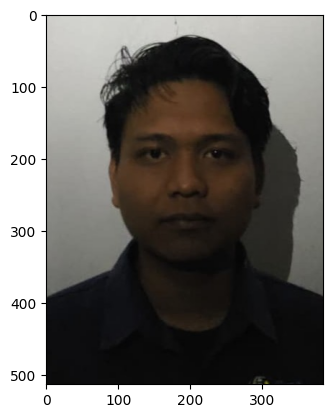

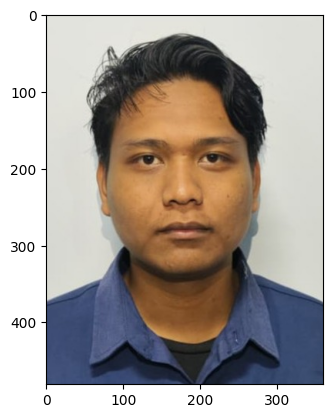

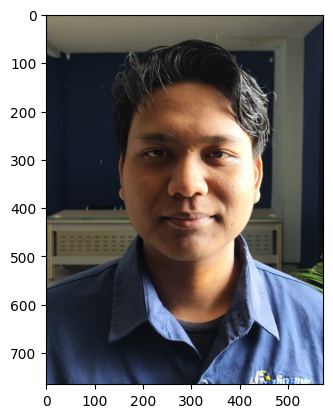

In [ ]:
#import gambar
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
face1 = cv.cvtColor(cv.imread('/content/drive/MyDrive/Image/face1.jpeg'), cv.COLOR_BGR2RGB)
face2 = cv.cvtColor(cv.imread('/content/drive/MyDrive/Image/face2.jpeg'), cv.COLOR_BGR2RGB)
face3 = cv.cvtColor(cv.imread('/content/drive/MyDrive/Image/face3.jpeg'), cv.COLOR_BGR2RGB)


plt.imshow(face1)
plt.show()
plt.imshow(face2)
plt.show()
plt.imshow(face3)
plt.show()

1. Tampilkan histogram tiap citra dan analisis distribusi intensitasnya.

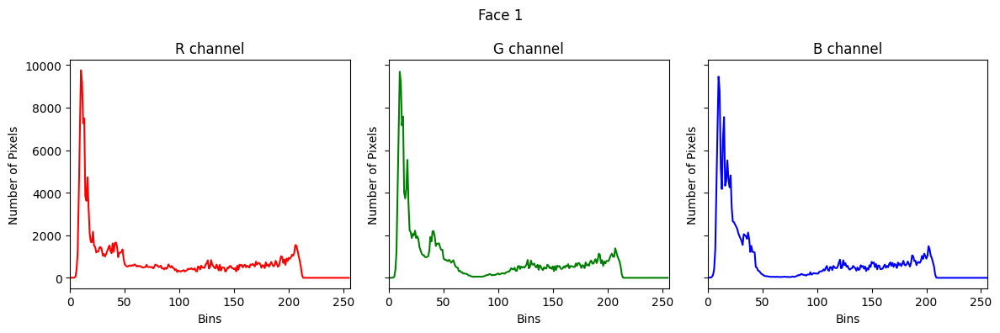

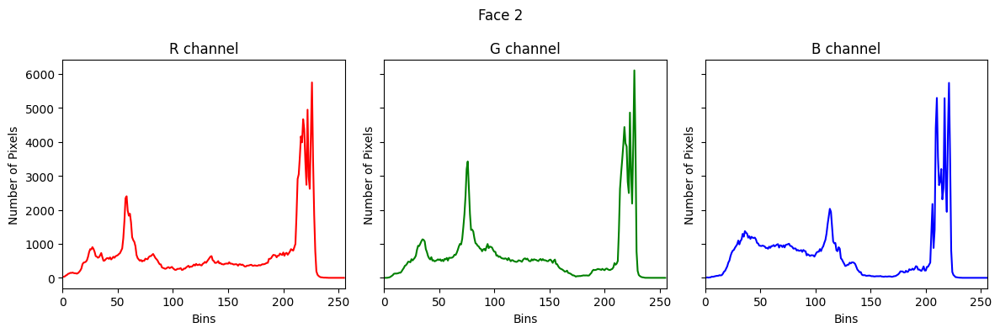

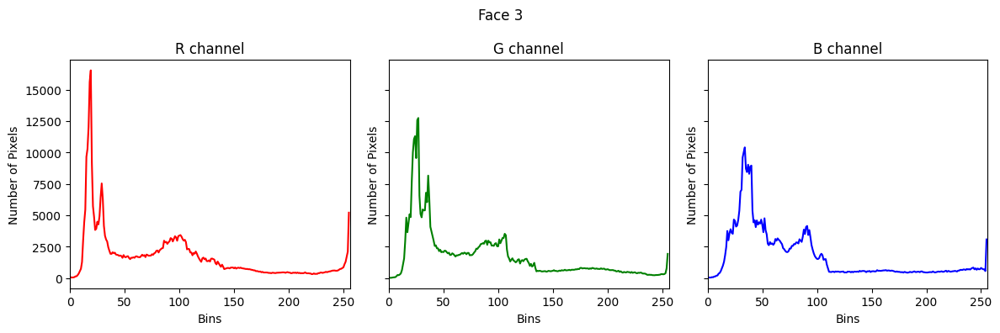

In [ ]:
def plot_histogram(image, title):
    colors = ('r', 'g', 'b')
    channels = cv.split(image)

    fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)
    fig.suptitle(title)

    for i, (ax, color) in enumerate(zip(axes, colors)):
        hist = cv.calcHist([image], [i], None, [256], [0, 256])
        ax.plot(hist, color=color)
        ax.set_title(f'{color.upper()} channel')
        ax.set_xlabel('Bins')
        ax.set_ylabel('Number of Pixels')
        ax.set_xlim([0, 256])

    plt.tight_layout()
    plt.show()

plot_histogram(face1, 'Face 1')
plot_histogram(face2, 'Face 2')
plot_histogram(face3, 'Face 3')

### 2. Terapkan transformasi brightness dan contrast (linear/log brightness).
 Tentukan nilai b (brightness) dan a (contrast) yang sesuai agar wajah tampak
natural.

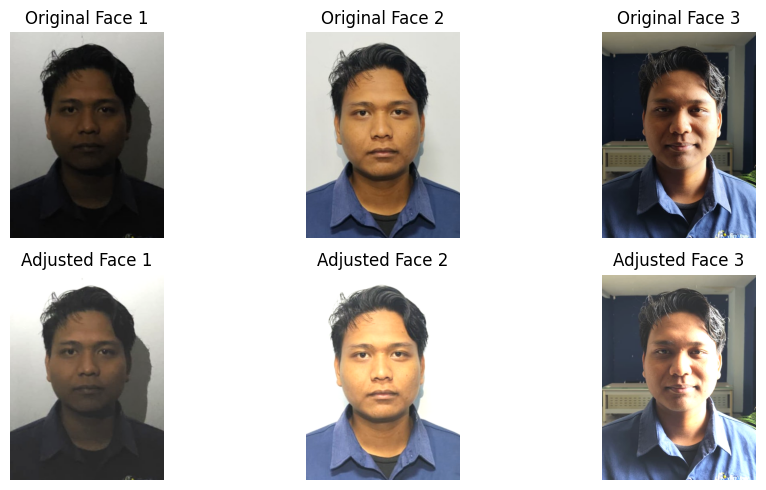

In [ ]:
# Apply brightness and contrast transformations
def adjust_brightness_contrast(image, alpha, beta):
    # alpha controls contrast, beta controls brightness
    adjusted_image = cv.convertScaleAbs(image, alpha=alpha, beta=beta)
    return adjusted_image

# Experiment with alpha and beta values
alpha = 1.2  # Contrast control (1.0-3.0)
beta = 30    # Brightness control (0-100)

face1_adjusted = adjust_brightness_contrast(face1, alpha, beta)
face2_adjusted = adjust_brightness_contrast(face2, alpha, beta)
face3_adjusted = adjust_brightness_contrast(face3, alpha, beta)

# Display the original and adjusted images
plt.figure(figsize=(10, 5))

plt.subplot(2, 3, 1)
plt.imshow(face1)
plt.title('Original Face 1')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(face2)
plt.title('Original Face 2')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(face3)
plt.title('Original Face 3')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(face1_adjusted)
plt.title('Adjusted Face 1')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(face2_adjusted)
plt.title('Adjusted Face 2')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(face3_adjusted)
plt.title('Adjusted Face 3')
plt.axis('off')

plt.tight_layout()
plt.show()

### 3. Lakukan histogram equalization untuk memperbaiki sebaran kontras.
 Bandingkan hasil visual dan histogram sebelum–sesudah.

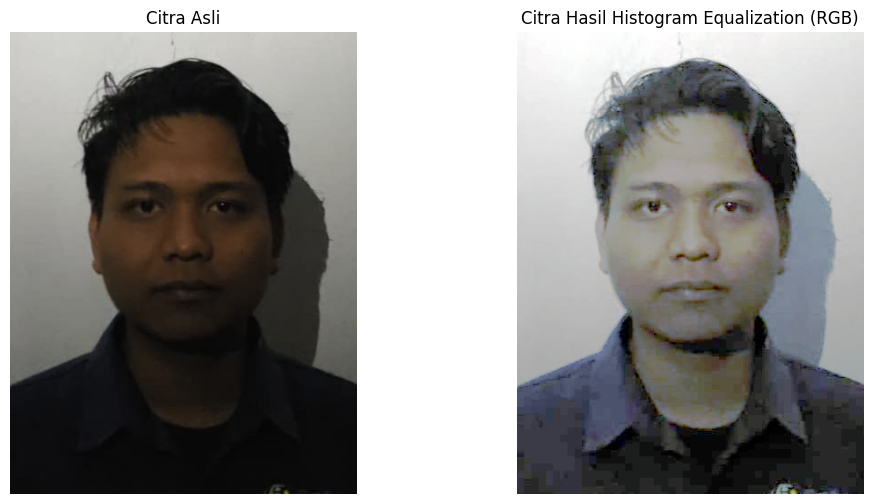

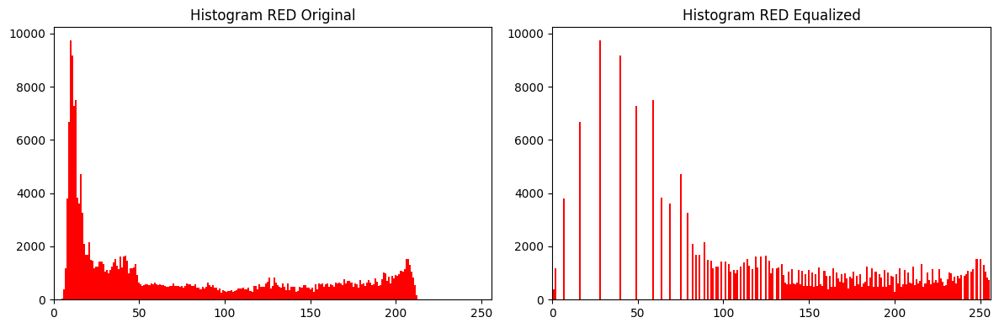

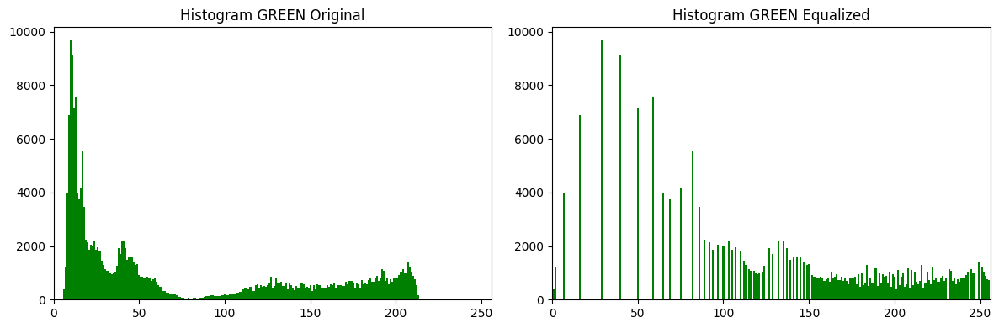

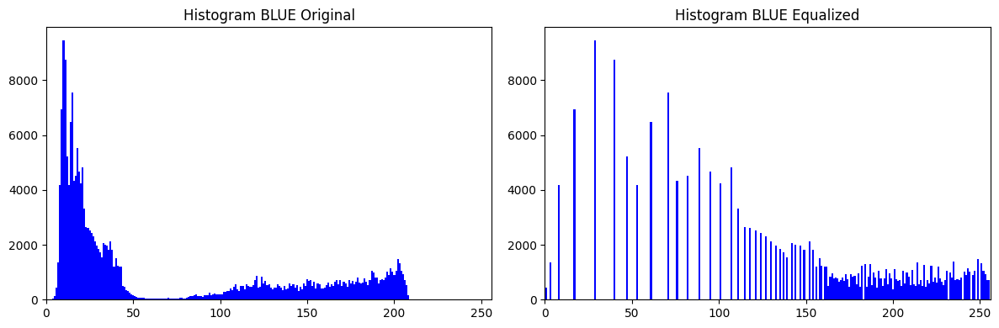

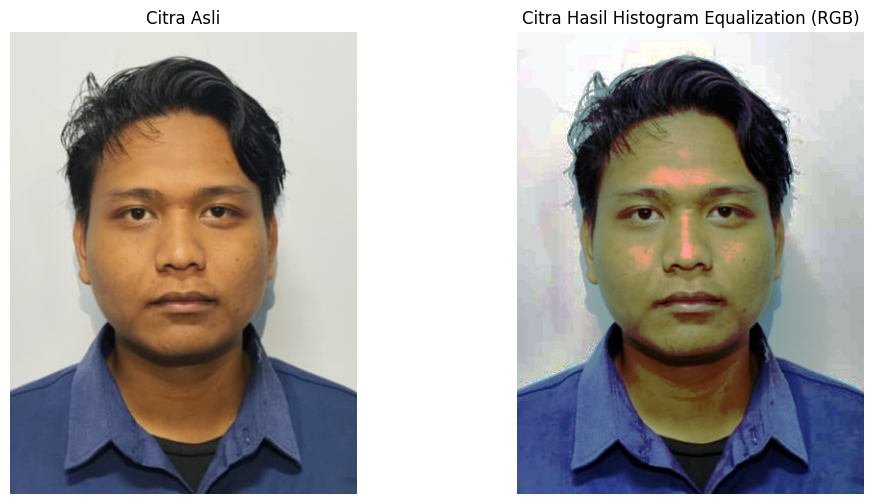

...

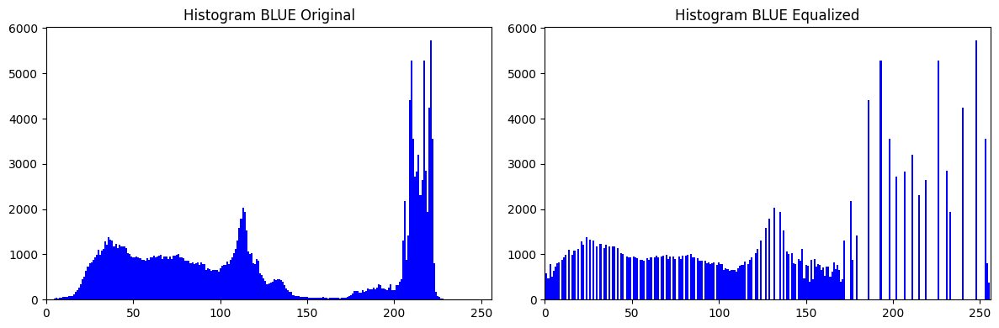

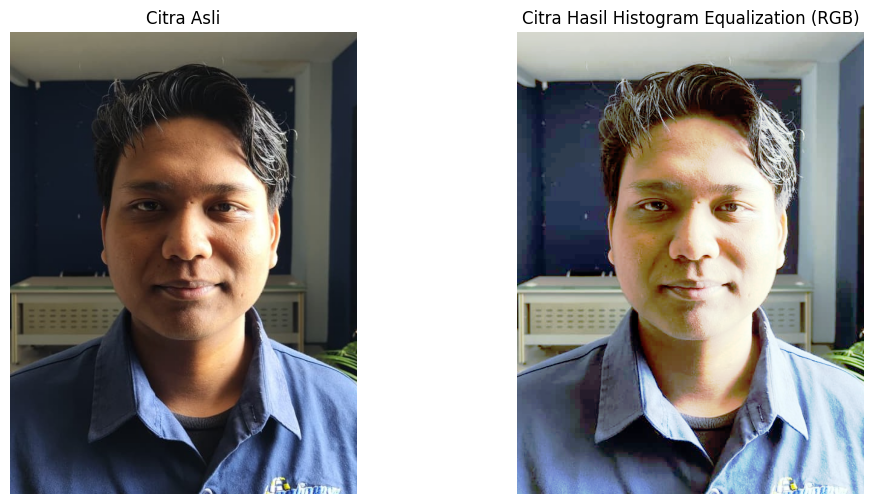

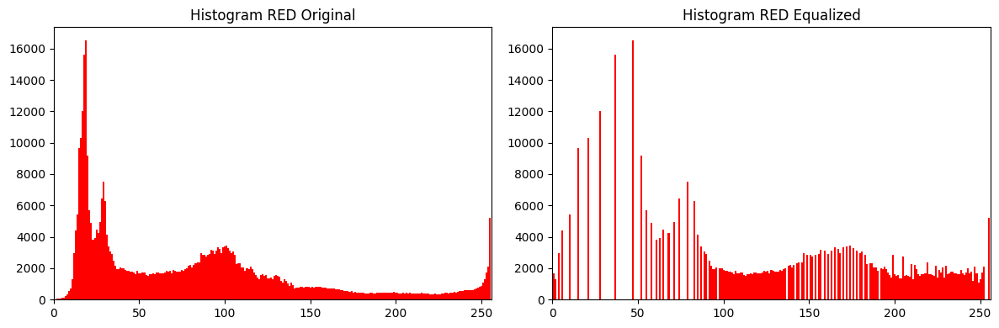

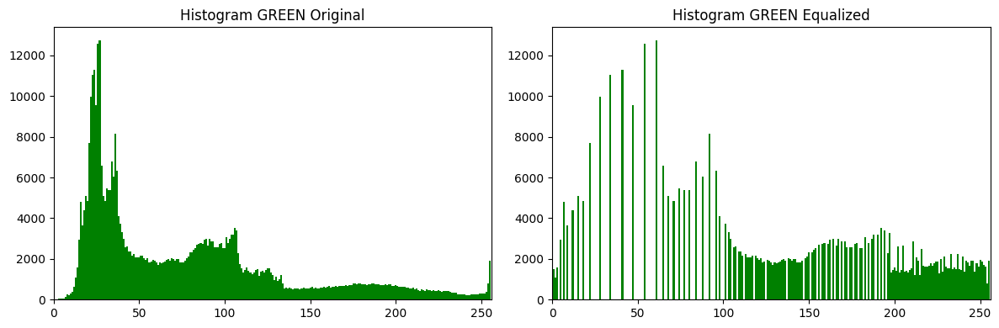

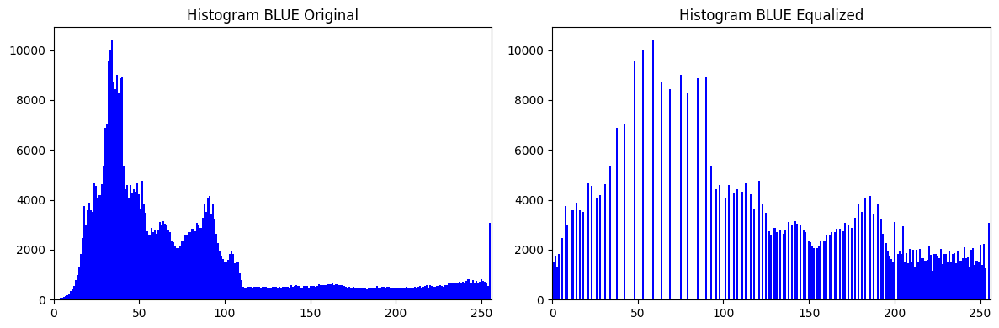

In [ ]:
# Fungsi untuk melakukan histogram equalization RGB
def equalize_rgb_image(image):
    # Pisahkan channel R, G, B
    r, g, b = image[:,:,0], image[:,:,1], image[:,:,2]

    # Equalisasi tiap channel
    r_eq = cv.equalizeHist(r)
    g_eq = cv.equalizeHist(g)
    b_eq = cv.equalizeHist(b)

    # Gabungkan kembali
    img_eq = cv.merge((r_eq, g_eq, b_eq))

    # Tampilkan hasil
    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("Citra Asli")
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(img_eq)
    plt.title("Citra Hasil Histogram Equalization (RGB)")
    plt.axis('off')
    plt.show()

    return img_eq  # return hasil equalized

# Fungsi untuk menampilkan histogram RGB sebelum & sesudah equalization
def plot_rgb_histograms(original, equalized):
    colors = ['red', 'green', 'blue']
    for i, color in enumerate(colors):
        orig_channel = original[:,:,i]
        eq_channel = equalized[:,:,i]

        hist_orig, _ = np.histogram(orig_channel.flatten(), 256, [0,256])
        hist_eq, _ = np.histogram(eq_channel.flatten(), 256, [0,256])

        plt.figure(figsize=(12,4))
        plt.subplot(1,2,1)
        plt.bar(range(256), hist_orig, color=color, width=1)
        plt.title(f'Histogram {color.upper()} Original')
        plt.xlim([0,256])

        plt.subplot(1,2,2)
        plt.bar(range(256), hist_eq, color=color, width=1)
        plt.title(f'Histogram {color.upper()} Equalized')
        plt.xlim([0,256])

        plt.tight_layout()
        plt.show()

# Contoh penggunaan:
face1eq = equalize_rgb_image(face1)
plot_rgb_histograms(face1, face1eq)
face2eq = equalize_rgb_image(face2)
plot_rgb_histograms(face2, face2eq)
face3eq = equalize_rgb_image(face3)
plot_rgb_histograms(face3, face3eq)

### 4. Terapkan filter spasial:
filter spasial
loww pass
high pass

In [ ]:
def convolution3d(image, kernel, stride=1, padding=0):
    """
    image  : array 3D input citra (RGB)
    kernel : array 2D atau 3D kernel/filter
    stride : langkah pergeseran filter
    padding: jumlah padding 0 di sekeliling citra
    """
    image = np.array(image, dtype=float)
    kernel = np.array(kernel, dtype=float)

    # Jika kernel 2D, gunakan untuk semua channel
    if kernel.ndim == 2:
        kernel = np.stack([kernel] * 3, axis=-1)  # duplikasi ke 3 channel

    # Pastikan input dan kernel memiliki 3 channel
    assert image.shape[2] == 3 and kernel.shape[2] == 3, "Image and kernel must have 3 channels (RGB)."

    i_h, i_w, i_c = image.shape
    k_h, k_w, _ = kernel.shape

    # Tambahkan padding
    if padding > 0:
        image_padded = np.pad(image, ((padding, padding), (padding, padding), (0, 0)), mode='constant')
    else:
        image_padded = image

    # Hitung ukuran output
    o_h = ((i_h + 2*padding - k_h) // stride) + 1
    o_w = ((i_w + 2*padding - k_w) // stride) + 1

    output = np.zeros((o_h, o_w, 3))

    # Lakukan konvolusi per channel
    for c in range(3):
        for y in range(o_h):
            for x in range(o_w):
                region = image_padded[y*stride:y*stride+k_h, x*stride:x*stride+k_w, c]
                output[y, x, c] = np.sum(region * kernel[:, :, c])

    # Normalisasi ke rentang 0–255 jika diperlukan
    output = np.clip(output, 0, 255)
    output = output.astype(np.uint8)

    return output

In [ ]:
def show_side_by_side(imgs, tits, figsize=(15,5)):
  plt.figure(figsize=figsize)
  for i, (img, tit) in enumerate(zip(imgs, tits)):
    if len(img.shape) == 2: #grayscale
      plt.subplot(1, len(imgs), i+1)
      plt.imshow(img, cmap='gray')
    else:
      plt.subplot(1, len(imgs), i+1)
      plt.imshow(img)
    plt.title(tit)
    plt.axis("off")
  plt.show()


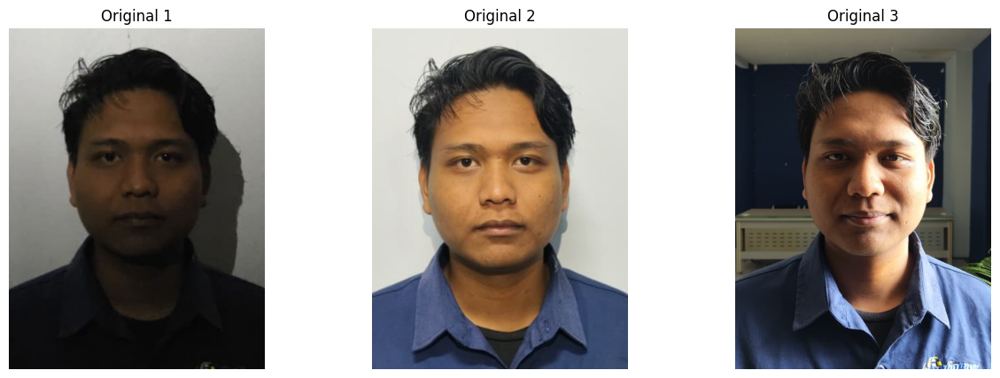

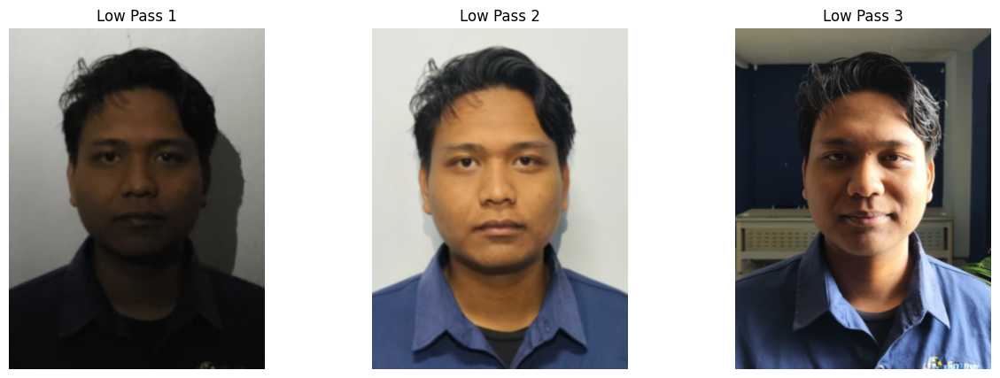

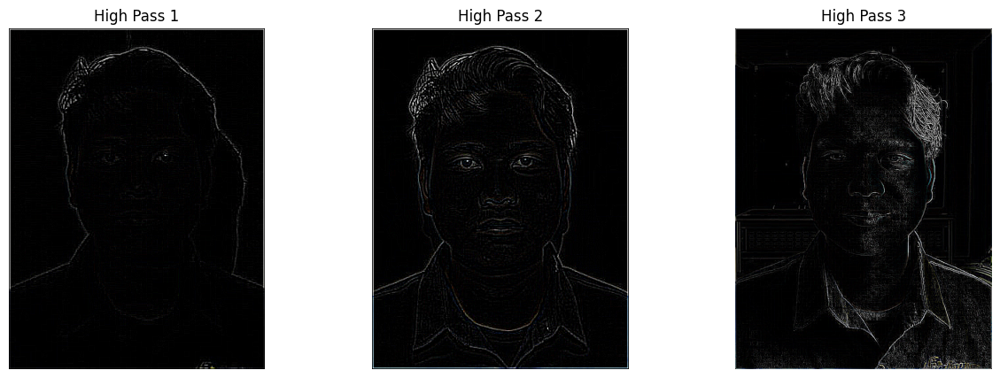

In [ ]:
face1low = cv.GaussianBlur(face1, (5, 5), 0)
face2low = cv.GaussianBlur(face2, (5, 5), 0)
face3low = cv.GaussianBlur(face3, (5, 5), 0)

kernel_canny_edge = np.array([[-1,-1,-1],
                           [-1,8,-1],
                           [-1,-1,-1]])

face1high = convolution3d(face1, kernel_canny_edge, 1, 2)
face2high = convolution3d(face2, kernel_canny_edge, 1, 2)
face3high = convolution3d(face3, kernel_canny_edge, 1, 2)

show_side_by_side([face1, face2, face3], ["Original 1", "Original 2", "Original 3"])
show_side_by_side([face1low, face2low, face3low], ["Low Pass 1", "Low Pass 2", "Low Pass 3"])
show_side_by_side([face1high, face2high, face3high], ["High Pass 1", "High Pass 2", "High Pass 3"])


### 5. Implementasikan Floyd–Steinberg Dithering untuk menurunkan kedalaman warna
wajah (bit-depth 4–6 bit), lalu analisis bagaimana efeknya terhadap detail dan ekspresi
wajah.

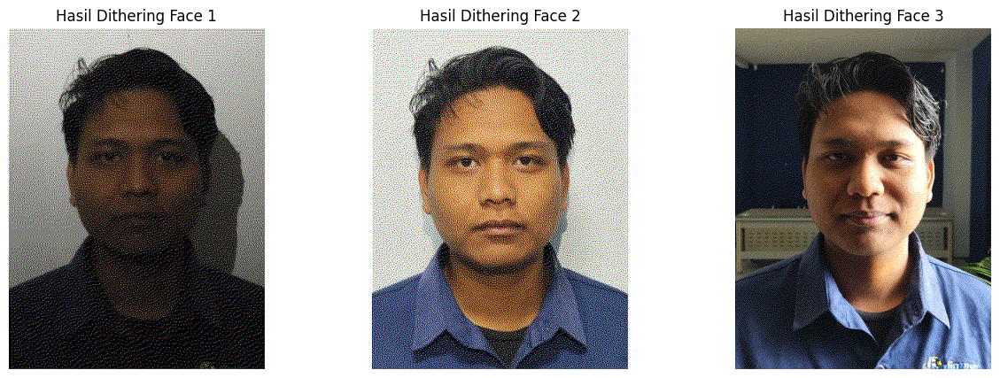

In [ ]:
#cari warna terdekat
def WarnaTerdekat(pixel):
  return np.where(pixel <128, 0, 255)

#truncate agar gx keluar 0-255
def Truncate(val):
  return np.clip(val, 0, 255)

def dithering(imeg):
    h, w, rgb = imeg.shape
    # Buat salinan gambar untuk menghindari modifikasi langsung pada input
    dithface1 = imeg.copy().astype(np.float32)

    for y in range(h-1):
        for x in range(w-1):
            old_pix = dithface1[y, x].copy()
            new_pix = WarnaTerdekat(old_pix)
            dithface1[y, x] = new_pix
            error = old_pix - new_pix

            # Sebarkan error ke pixel tetangga
            # Kanan
            if x + 1 < w:
                dithface1[y, x+1] = Truncate(dithface1[y, x+1] + (7/16) * error)
            # Bawah kiri
            if y + 1 < h and x - 1 >= 0:
                dithface1[y+1, x-1] = Truncate(dithface1[y+1, x-1] + (3/16) * error)
            # Bawah
            if y + 1 < h:
                dithface1[y+1, x] = Truncate(dithface1[y+1, x] + (5/16) * error)
            # Bawah kanan
            if y + 1 < h and x + 1 < w:
                dithface1[y+1, x+1] = Truncate(dithface1[y+1, x+1] + (1/16) * error)

    # Konversi kembali ke tipe data yang sesuai untuk gambar
    output = dithface1.astype(np.uint8)
    return output

dithface1 = dithering(face1)
dithface2 = dithering(face2)
dithface3 = dithering(face3)

show_side_by_side([dithface1, dithface2, dithface3], ["Hasil Dithering Face 1","Hasil Dithering Face 2","Hasil Dithering Face 3"])


### Analisis Efek Floyd-Steinberg Dithering

Setelah menerapkan Floyd-Steinberg dithering dengan kedalaman warna 4 dan 6 bit, perhatikan perbedaan visual pada citra:

*   **Detail:** Pada 4-bit dithering, terlihat penurunan detail yang signifikan, terutama pada area dengan gradasi warna halus seperti kulit dan bayangan. Pola dithering (noise) menjadi lebih jelas. Pada 6-bit dithering, detail lebih terjaga dibandingkan 4-bit, namun masih ada sedikit kehilangan dibandingkan citra asli.
*   **Ekspresi Wajah:** Meskipun detail menurun, ekspresi wajah secara umum masih dapat dikenali pada kedua hasil dithering. Namun, nuansa halus dalam ekspresi (misalnya, sedikit kerutan atau perubahan warna kulit yang menunjukkan emosi) mungkin menjadi kurang jelas atau hilang pada 4-bit dithering. Pada 6-bit, ekspresi wajah terlihat lebih natural dan mendekati citra asli.

Secara keseluruhan, Floyd-Steinberg dithering membantu mensimulasikan lebih banyak warna dengan menggunakan pola spasial dari warna-warna yang tersedia. Semakin rendah bit-depth, semakin sedikit warna yang tersedia, sehingga pola dithering menjadi lebih kasar dan detail visual menurun. Namun, dithering ini efektif dalam mempertahankan persepsi gradasi warna dibandingkan dengan hanya memotong (truncating) nilai piksel.

## Bagian B – Analisis
Jawablah dalam bentuk narasi atau tabel analisis singkat:

### 1. Bagaimana perubahan nilai brightness dan contrast memengaruhi hasil histogram wajah gelap?

Jawab: nilai brightness tinggi akan menggeser histogram ke anan sehingga gambar gambar tampak lebih terang, sedangkan yang rendah akan menggeser histogram ke arah kiri. nilai kontras tinggi akan membuat histogram melebar ke kanan dan kiri sehingga area gelap akan tambah gelap dan yang terang akan makin terang, sedangkan sebaliknya jika angka kontras rendah histogram akan menyempit di tengah sehingga detail wajah terlihat flat

### 2. Apakah histogram equalization selalu memperbaiki detail wajah? Jelaskan alasannya dengan contoh hasil Anda.

Jawab: tidak. histogram equalization tidak selalu bisa memperbaiki detail wajah. tapi pada wajah gelap dapat membantu menampilkan detail tersembunyi dengan meratakan distribusi dari area histogram gelap. contohnya ada pada face1 yang pada awalnya gelap, setelah ditambahkan hist equalization menjadi terlihat detail yang tadinya tidak terlihat dan pada face 3 dapat dilihat perbedaannya.

### 3. Bandingkan hasil low-pass dan high-pass filter pada area wajah — bagian mana yang paling terpengaruh?

| Fitur Wajah | Efek Filter Low-Pass (Menghaluskan) | Efek Filter High-Pass (Menajamkan) |
| :--- | :--- | :--- |
| **Tekstur Kulit** <br> (Pori-pori, kerutan halus) | **Sangat terpengaruh.** Pori-pori dan noda menjadi tersamarkan atau hilang. Kulit tampak sangat mulus dan "blur". | **Cukup terpengaruh.** Menonjolkan semua tekstur. Pori-pori dan kerutan akan terlihat sebagai garis-garis tajam. |
| **Garis Wajah** <br> (Hidung, mata, bibir, rahang) | Kurang terpengaruh. Kontur wajah hanya menjadi sedikit lebih lembut dan kurang tegas. | **Sangat terpengaruh.** Garis kontur ini menjadi sangat dominan, tajam, dan jelas. Ini adalah bagian yang paling ditonjolkan. |
| **Rambut & Alis** | Helai-helai rambut cenderung menyatu dan kehilangan detail individualnya, tampak seperti satu kesatuan yang lembut. | Setiap helai rambut yang memiliki kontras dengan sekitarnya akan terlihat sangat jelas, terpisah, dan tajam. |
| **Area Mulus** <br> (Pipi, dahi) | Perubahan minimal. Area yang sudah mulus hanya akan terlihat sedikit lebih kabur atau halus. | Area ini akan menjadi abu-abu netral atau hitam karena tidak memiliki informasi "tepi" (frekuensi tinggi) untuk ditampilkan. |
| **Hasil Visual Keseluruhan**| Gambar menjadi lebih "lembut" (soft), sering disebut efek *blur* atau seperti *beauty filter*. | Gambar terlihat seperti sketsa, ukiran (emboss), atau hasil deteksi tepi (*edge detection*). |

### 4. Mengapa proses dithering bisa mempertegas atau justru mengaburkan ekspresi wajah?

Jawaban: Dithering mempertegas ekspresi dengan menonjolkan garis bentuk dan bentuk utama, namun mengaburkan ekspresi dengan menghilangkan detail gradasi warna yang halus.

### 5. Berdasarkan hasil percobaan Anda, kombinasi teknik mana yang paling efektif untuk meningkatkan readability fitur wajah sebelum tahap deteksi?

Kombinasi paling efektif untuk meningkatkan keterbacaan fitur wajah sebelum deteksi dimulai dengan **Histogram Equalization** untuk memaksimalkan kontras gambar secara global, sehingga fitur yang tadinya samar menjadi jelas. Setelah kontras diperbaiki, **Low-Pass Filter** (seperti Gaussian blur ringan) diterapkan untuk menghaluskan noise minor pada kulit wajah, yang berfungsi untuk mencegah noise tersebut diperkuat pada tahap selanjutnya. Terakhir, **High-Pass atau Laplacian Filter** digunakan untuk menajamkan tepi-tepi fitur krusial seperti mata, alis, dan bibir, membuatnya sangat jelas bagi algoritma deteksi. Alur kerja ini jauh lebih superior dibandingkan sekadar penyesuaian brightness dan contrast biasa, sementara teknik seperti **Floyd-Steinberg Dithering** justru harus dihindari karena mengurangi kedalaman warna akan menghilangkan informasi detail yang vital untuk proses deteksi.

## Bagian C – Implementasi (Python–OpenCV)

- Gunakan struktur kode seperti:<br>
import cv2, numpy as np, matplotlib.pyplot as plt<br>
img = cv2.imread('face1.jpg', cv2.IMREAD_COLOR)<br>
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

- Brightness & Contrast<br>
b, a = 30, 1.2<br>
img_bc = cv2.convertScaleAbs(gray, alpha=a, beta=b)

- Histogram Equalization <br>
img_he = cv2.equalizeHist(img_bc)

- Spatial Filtering (contoh High-pass)<br>
kernel_hp = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])<br>
img_hp = cv2.filter2D(img_he, -1, kernel_hp)<br>
- Kemudian tampilkan hasil 4 tahap (asli → BC → HE → Filter → Dithered).


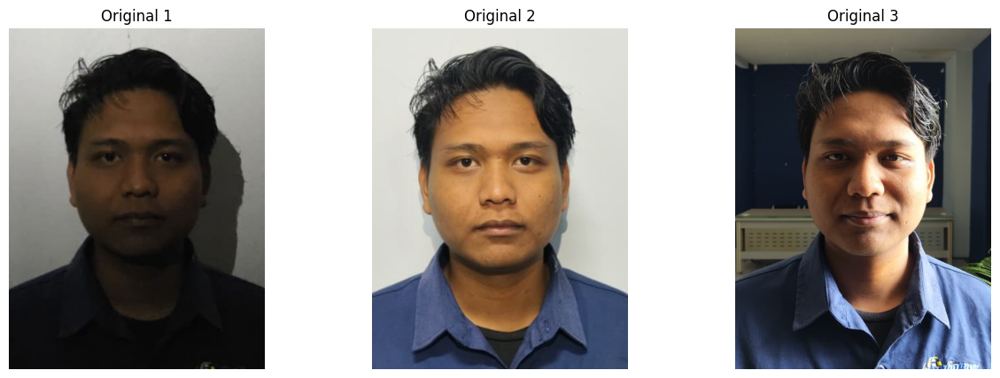

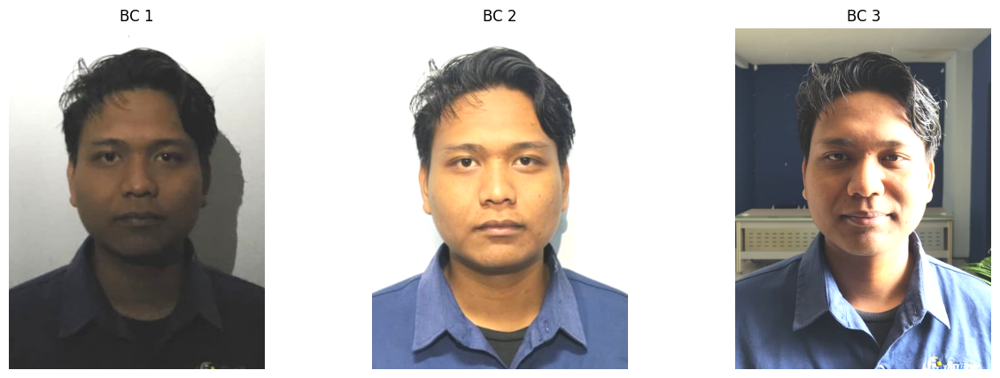

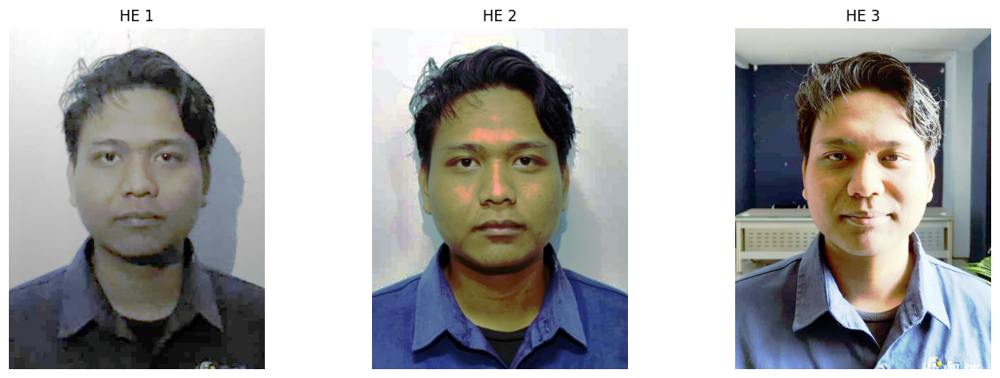

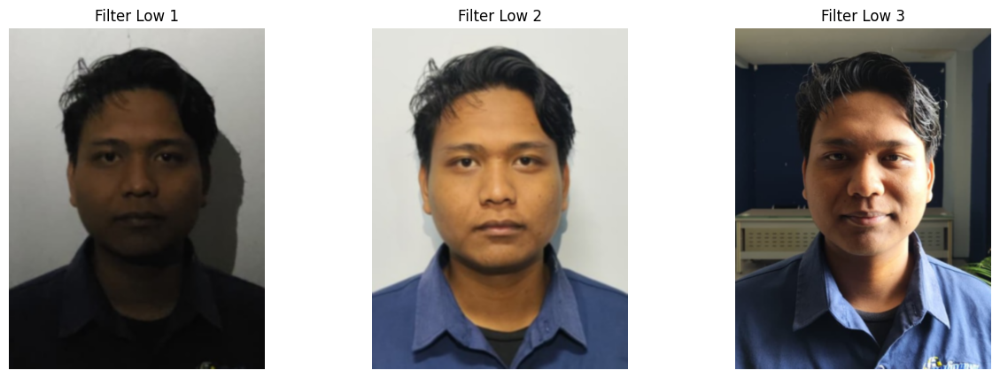

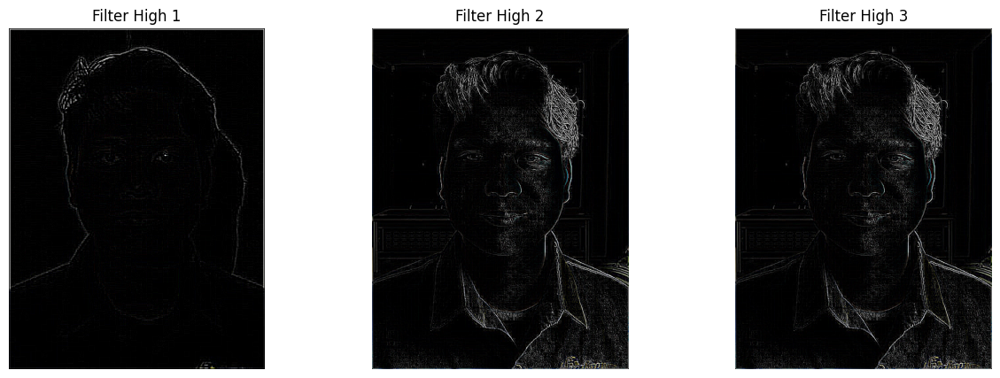

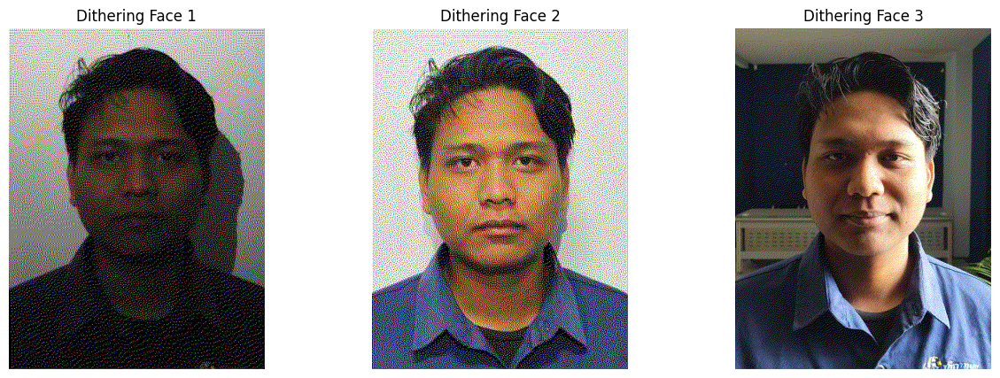

In [ ]:
show_side_by_side([face1, face2, face3], ["Original 1", "Original 2", "Original 3"])
show_side_by_side([face1_adjusted, face2_adjusted, face3_adjusted], ["BC 1", "BC 2", "BC 3"])
show_side_by_side([face1eq, face2eq, face3eq], ["HE 1", "HE 2", "HE 3"])
show_side_by_side([face1low, face2low, face3low], ["Filter Low 1", "Filter Low 2", "Filter Low 3"])
show_side_by_side([face1high, face3high, face3high], ["Filter High 1", "Filter High 2", "Filter High 3"])
show_side_by_side([dithface1, dithface2, dithface3], ["Dithering Face 1","Dithering Face 2","Dithering Face 3"])


Bagian D – Analisis Akhir & Kesimpulan
Tuliskan 1 halaman analisis:

• Urutan proses terbaik untuk menghasilkan wajah paling siap recognition

• Perbandingan nilai PSNR antara citra asli yang memiliki pencahanyaan baik dan hasil pra-
pemrosesan

• Rekomendasi metode peningkatan kualitas wajah untuk sistem pengenalan wajah real-time

**Urutan proses terbaik untuk menghasilkan wajah paling siap recognition**

|Proses | Teknik | Tujuan | Kondisi Ideal |
|---|---|---|---|
|1|Brightness & Contrast |Mengatur pencahayaan agar tidak sesuai|Sangat direkomendasikan, terutama pada iamge gelap|
|2|Low-pass Filter (Gaussian)|Mengurangi noise |Dapat diimplementasikan pada gambar banyak noise|
|3|Histogram Equalization|Menyebarkan intensitas Histogram untuk |Sangat direkomendasikan untuk gambar dengan kontras rendah agar detail lebih terlihat|
|4|High-pass Filter|Mempertajam tepi yang kontras|Opsional saat diperlukan setelah Hist Equaization|
|5|Floyd-Steinberg Dithering |Mengurangi jumlah warna dalam sebuah gambar tanpa kehilangan detail visual yang signifikan|Saat perlu mengurangi jumlah warna dalam suatu gambar|

In [ ]:
from math import log10, sqrt
def PSNR(ori, kw):
    mse = np.mean((ori - kw) ** 2)
    if mse == 0:
        return 100
    max_piksel = 255.0
    psnr = 20 * log10(max_piksel / sqrt(mse))
    return psnr

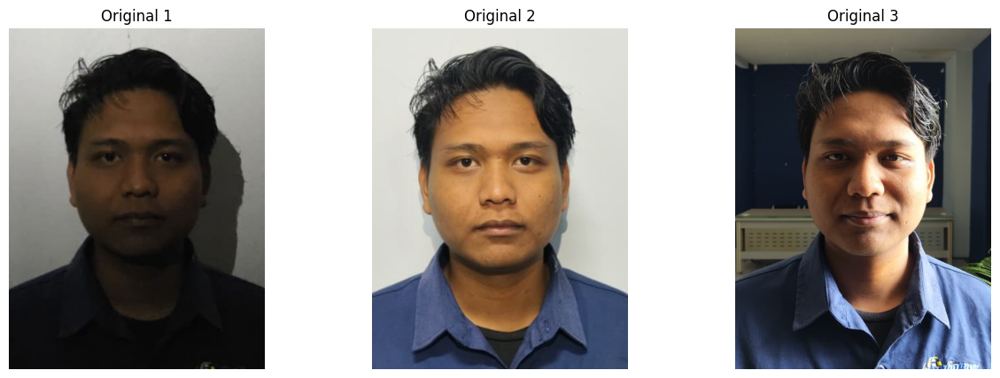

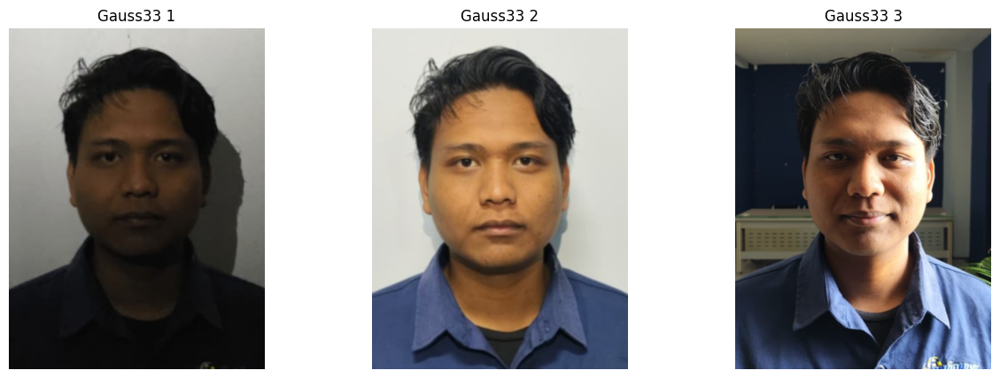

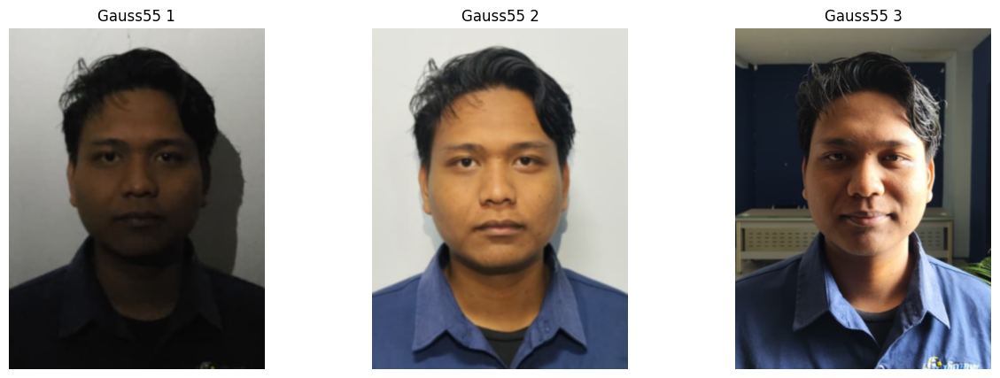

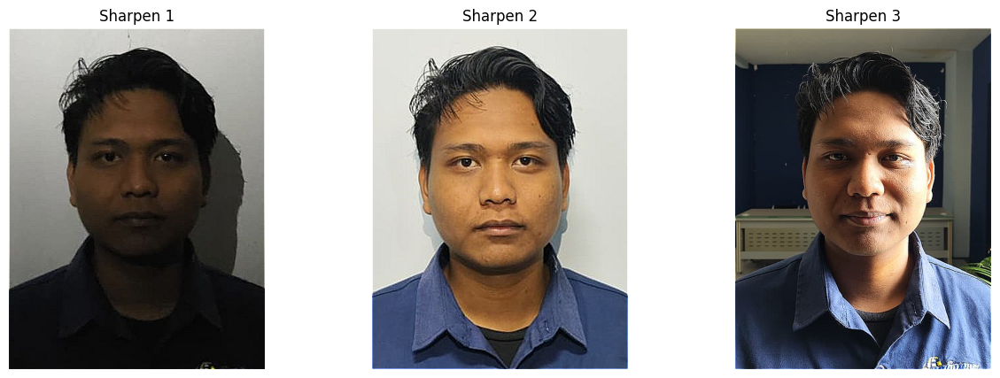

In [ ]:
# Perbandingan nilai PSNR antara citra asli yang memiliki pencahanyaan baik dan hasil pra-pemrosesan
face1gauss33 = cv.GaussianBlur(face1, (3,3), 1)
face2gauss33 = cv.GaussianBlur(face2, (3,3), 1)
face3gauss33 = cv.GaussianBlur(face3, (3,3), 1)

face1gauss55 = cv.GaussianBlur(face1, (5,5), 1)
face2gauss55 = cv.GaussianBlur(face2, (5,5), 1)
face3gauss55 = cv.GaussianBlur(face3, (5,5), 1)

kernel_sharpen = np.array([[0,-1,0],
                           [-1,5,-1],
                           [0,-1,0]])
face1sharpen = convolution3d(face1, kernel_sharpen, 1, 1)
face2sharpen = convolution3d(face2, kernel_sharpen, 1, 1)
face3sharpen = convolution3d(face3, kernel_sharpen, 1, 1)

show_side_by_side([face1, face2, face3], ["Original 1", "Original 2", "Original 3"])
show_side_by_side([face1gauss33, face2gauss33, face3gauss33], ["Gauss33 1", "Gauss33 2", "Gauss33 3"])
show_side_by_side([face1gauss55, face2gauss55, face3gauss55], ["Gauss55 1", "Gauss55 2", "Gauss55 3"])
show_side_by_side([face1sharpen, face2sharpen, face3sharpen], ["Sharpen 1", "Sharpen 2", "Sharpen 3"])

In [ ]:
#bandingkan nilai psnr
#3x3 ori
gaus33 = {"face1": PSNR(face1, face1gauss33), "face2": PSNR(face2, face2gauss33), "face3": PSNR(face3, face3gauss33)}
gaus55 = {"face1": PSNR(face1, face1gauss55), "face2": PSNR(face2, face2gauss55), "face3": PSNR(face3, face3gauss55)}
sharpppp = {"face1": PSNR(face1, face1sharpen), "face2": PSNR(face2, face2sharpen), "face3": PSNR(face3, face3sharpen)}

for i in gaus33:
  print(f"Perbandingan Nilai PSNR face dengan gaussian 3x3 {i}: {gaus33[i]}")

print("========================================================================")
#5x5 ori
for i in gaus55:
  print(f"Perbandingan Nilai PSNR face dengan gaussian 5x5 {i}: {gaus55[i]}")

print("========================================================================")
#sharpen
for i in sharpppp:
  print(f"Perbandingan Nilai PSNR face dengan sharpen {i}: {sharpppp[i]}")

Perbandingan Nilai PSNR face dengan gaussian 3x3 face1: 46.11678313620412
Perbandingan Nilai PSNR face dengan gaussian 3x3 face2: 41.638538557908674
Perbandingan Nilai PSNR face dengan gaussian 3x3 face3: 37.97523346362421
Perbandingan Nilai PSNR face dengan gaussian 5x5 face1: 44.45175690690882
Perbandingan Nilai PSNR face dengan gaussian 5x5 face2: 39.90649157525019
Perbandingan Nilai PSNR face dengan gaussian 5x5 face3: 37.18837119801357
Perbandingan Nilai PSNR face dengan sharpen face1: 38.31759265831853
Perbandingan Nilai PSNR face dengan sharpen face2: 34.386209552352334
Perbandingan Nilai PSNR face dengan sharpen face3: 33.10987754219616


Hasil nilai PSNR menghasilkan hasil yang cukup mirip dari perbandingan gambar asli dengan gambar yang diberi gaussian 3x3 dan 5x5. gaussian 3x3 secara konsisten memberikan nilai PSNR yang lebih tinggi daripada gaussian 5x5, karena pada gaussian 5x5 akan membuat gambar asli akan kehilangan lebih banyak detail yang menyebabkan error lebih besar, sehingga nilai PSNR akan lebih rendah. Lalu pada perbandingan sharpen dengan gambar asli menunjukkan niai PSNR cukup rendah hingag 33.1 Db, hal ini dikarenakan detail dari gambar yang lebih tajam menyebabkan perbedaan dari kedua citra menjadi lebih terasa.


**Rekomendasi metode peningkatan kualitas wajah untuk sistem pengenalan wajah real-time**

1. Brightness & Contrast adjustment, langkah awal untuk mernormalkan pencahayaan secara global.
2, Hist Equal, untuk menyeimbangkan kontras, agar detail wajah tampak jelas.
3. filter spasial(opsional), dapat dipakai saat gambar memiliki noise tinggi.